In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from glob import glob

In [10]:
# Ortam değişkenlerini ayarlayalım
os.environ["PYHTONHASHSEED"] = str(42)
np.random.seed(42)
tf.random.set_seed(42)

# Hyperparameters
batch_size = 8
lr = 1e-5
epochs = 30
height = 512
width = 512

# Veri seti dizini
dataset_dir ="C:\\Users\\ASUS\\Desktop\\unet_veri"

In [3]:
for subset in ['train', 'test']:
    subset_dir = os.path.join(dataset_dir, subset)
    images_dir = os.path.join(subset_dir, "images")
    masks_dir = os.path.join(subset_dir, "masks")

    for directory in [images_dir, masks_dir]:
        for filename in os.listdir(directory):
            file_path = os.path.join(directory, filename)
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Gri tonlamaya dönüştür
            if img is not None:
                resized_img = cv2.resize(img, (width, height))
                cv2.imwrite(file_path, resized_img)
            else:
                print(f"File {file_path} could not be read.")

print("Resizing complete.")

Resizing complete.


In [4]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate

def build_unet(input_shape, n_classes=1):
    def conv_block(inputs, num_filters):
        x = Conv2D(num_filters, 3, activation='relu', padding='same')(inputs)
        x = Conv2D(num_filters, 3, activation='relu', padding='same')(x)
        x = BatchNormalization()(x)
        return x

    def encoder_block(inputs, num_filters):
        x = conv_block(inputs, num_filters)
        p = MaxPool2D((2, 2))(x)
        return x, p

    def decoder_block(inputs, skip, num_filters):
        x = Conv2DTranspose(num_filters, (3, 3), strides=(2, 2), padding='same')(inputs)
        x = Concatenate()([x, skip])
        x = conv_block(x, num_filters)
        return x

    inputs = tf.keras.Input(shape=input_shape)

    # ENCODER
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    # BRIDGE
    b1 = conv_block(p4, 512)

    # DECODER
    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    # Additional Convolutional Blocks for Deepening the Network
    d5 = conv_block(d4, 32)
    d6 = conv_block(d5, 32)

    # Output layer
    if n_classes == 1:
        activation = 'sigmoid'
    else:
        activation = 'softmax'

    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(d6)

    model = tf.keras.Model(inputs, outputs, name="U-Net")
    return model

In [5]:
# Veri yükleme fonksiyonu
def load_data(path):
    train_x = sorted(glob(os.path.join(path, "train", "images", "*")))
    train_y = sorted(glob(os.path.join(path, "train", "masks", "*")))
    test_x = sorted(glob(os.path.join(path, "test", "images", "*")))
    test_y = sorted(glob(os.path.join(path, "test", "masks", "*")))
    return (train_x, train_y), (test_x, test_y)

# TensorFlow veri kümesi fonksiyonu
def tf_parse(x, y):
    x = tf.io.read_file(x)
    x = tf.image.decode_image(x, channels=1)  # Tek kanal (grayscale) resimler
    x = tf.cast(x, tf.float32) / 255.0
    
    y = tf.io.read_file(y)
    y = tf.image.decode_image(y, channels=1)  # Tek kanal (grayscale) maskeler
    y = tf.cast(y, tf.float32) / 255.0
    
    return x, y

def tf_dataset(x, y, batch=8):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=1000)  # Veri artırma için karıştırma işlemi
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

# Veri yükleme
(train_x, train_y), (test_x, test_y) = load_data(dataset_dir)

# Modeli oluşturalım
input_shape = (height, width, 1)  # Grayscale olduğu için kanal sayısı 1
model = build_unet(input_shape)

opt = tf.keras.optimizers.Adam(lr)

In [6]:
# Eğitim ve doğrulama setlerinin boyutlarını yazdıralım
print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Test: {len(test_x)} - {len(test_y)}")

Train: 1100 - 1100
Test: 400 - 400


In [7]:
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 512, 512, 1)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d (Conv2D)               │ (None, 512, 512, 32)      │             320 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_1 (Conv2D)             │ (None, 512, 512, 32)      │           9,248 │ conv2d[0][0]               │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization           │ (None, 512, 512, 32)      │             128 │ conv2d_1[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 256, 256, 32)      │               0 │ batch_normalization[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)             │ (None, 256, 256, 64)      │          18,496 │ max_pooling2d[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 256, 256, 64)      │          36,928 │ conv2d_2[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_1         │ (None, 256, 256, 64)      │             256 │ conv2d_3[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_1               │ (None, 128, 128, 64)      │               0 │ batch_normalization_1[0][… │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 128, 128, 128)     │          73,856 │ max_pooling2d_1[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 128, 128, 128)     │         147,584 │ conv2d_4[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_2         │ (None, 128, 128, 128)     │             512 │ conv2d_5[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_2               │ (None, 64, 64, 128)       │               0 │ batch_normalization_2[0][… │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 64, 64, 256)       │         295,168 │ max_pooling2d_2[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_7 (Conv2D)             │ (None, 64, 64, 256)       │         590,08

 Total params: 8,673,057 (33.09 MB)

 Trainable params: 8,669,985 (33.07 MB)

 Non-trainable params: 3,072 (12.00 KB)

In [8]:
model_file = "C:\\Users\\ASUS\\Desktop\\unet_veri\\files\\model-file.keras"
log_file = "C:\\Users\\ASUS\\Desktop\\unet_veri\\files\\log-file.csv"

In [11]:
# TensorFlow veri kümesi oluşturalım
train_dataset = tf_dataset(train_x, train_y, batch=batch_size)
test_dataset = tf_dataset(test_x, test_y, batch=batch_size)

dice_coefficient = tf.keras.metrics.MeanIoU(num_classes=2)
jaccard_index = tf.keras.metrics.MeanIoU(num_classes=2)
precision = tf.keras.metrics.Precision()
recall = tf.keras.metrics.Recall()

# Modeli derlerken metrikleri belirtin
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy', dice_coefficient, jaccard_index, precision, recall], run_eagerly=True)


# Geri çağrılar
callbacks = [
    ModelCheckpoint(model_file, verbose=1, save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4),
    CSVLogger(log_file),
    EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
]

# Modeli eğitelim
history = model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=test_dataset,
    callbacks=callbacks
)

Epoch 1/30
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.4904 - loss: 0.7941 - mean_io_u_2: 0.4305 - mean_io_u_3: 0.4305 - precision_1: 0.2660 - recall_1: 0.6221 
Epoch 1: val_loss improved from inf to 0.63388, saving model to C:\Users\ASUS\Desktop\unet_veri\files\model-file.keras
138/138 ━━━━━━━━━━━━━━━━━━━━ 1593s 12s/step - accuracy: 0.4908 - loss: 0.7934 - mean_io_u_2: 0.4305 - mean_io_u_3: 0.4305 - precision_1: 0.2664 - recall_1: 0.6227 - val_accuracy: 0.7360 - val_loss: 0.6339 - val_mean_io_u_2: 0.4201 - val_mean_io_u_3: 0.4201 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 2/30
138/138 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.7684 - loss: 0.4679 - mean_io_u_2: 0.4300 - mean_io_u_3: 0.4300 - precision_1: 0.5800 - recall_1: 0.8520 
Epoch 2: val_loss improved from 0.63388 to 0.53998, saving model to C:\Users\ASUS\Desktop\unet_veri\files\model-file.keras
138/138 ━━━━━━━━━━━━━━━━━━━━ 1584s 11s/step - accuracy: 0.7687 - loss: 0

In [18]:
import numpy as np
import tensorflow as tf

def calculate_confusion_matrix_elements(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    
    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))
    
    return TP, TN, FP, FN

def calculate_metrics(TP, TN, FP, FN):
    jaccard = TP / (TP + FP + FN)
    dice = 2 * TP / (2 * TP + FP + FN)
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1 = 2 * precision * recall / (precision + recall)
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    
    return accuracy, dice, jaccard, f1, precision, recall

def evaluate_model(model, test_dataset):
    y_true_all = []
    y_pred_all = []

    for x, y in test_dataset:
        y_pred = model.predict(x)
        y_pred = (y_pred > 0.5).astype(np.uint8)

        y_true_all.append(y.numpy())
        y_pred_all.append(y_pred)

    y_true_all = np.concatenate(y_true_all, axis=0)
    y_pred_all = np.concatenate(y_pred_all, axis=0)

    TP, TN, FP, FN = calculate_confusion_matrix_elements(y_true_all, y_pred_all)

    accuracy, dice, jaccard, f1, precision, recall = calculate_metrics(TP, TN, FP, FN)

    print(f"True Positives (TP): {TP}")
    print(f"True Negatives (TN): {TN}")
    print(f"False Positives (FP): {FP}")
    print(f"False Negatives (FN): {FN}")

    print(f"Pixel Accuracy: {accuracy}")
    print(f"Jaccard Index: {jaccard}")
    print(f"Dice Coefficient: {dice}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

# Modeli değerlendirme işlevini çağırma
evaluate_model(model, test_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


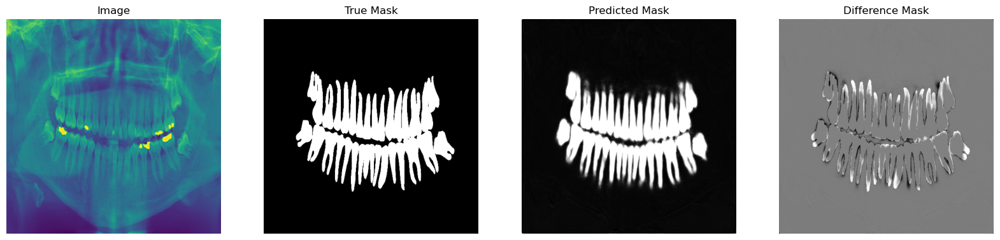

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


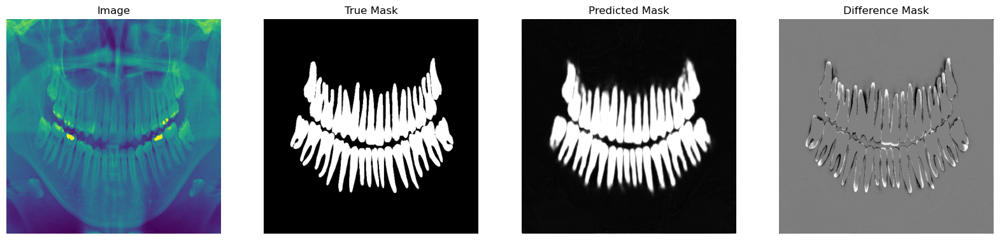

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


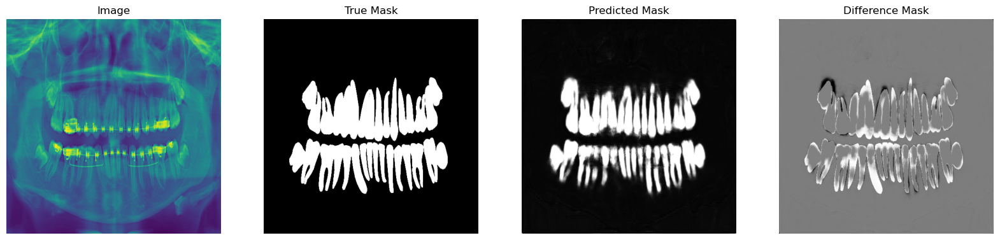

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


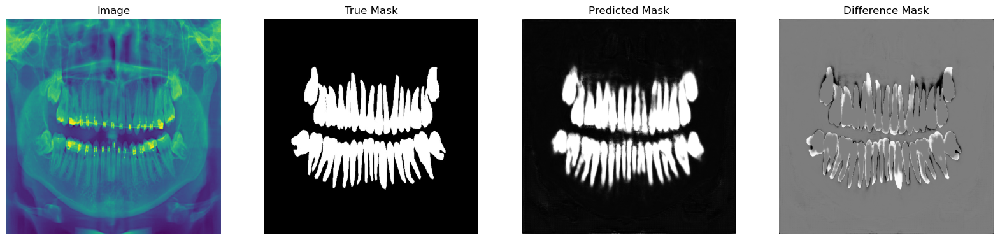

In [29]:
import matplotlib.pyplot as plt

def plot_images(image, true_mask, predicted_mask):
    # 4 görsel için subplot oluşturma
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Görüntüyü çizme
    axes[0].imshow(image)
    axes[0].set_title('Image')
    axes[0].axis('off')

    # Gerçek maskeyi çizme
    axes[1].imshow(true_mask, cmap='gray')
    axes[1].set_title('True Mask')
    axes[1].axis('off')

    # Tahmin edilen maskeyi çizme
    axes[2].imshow(predicted_mask, cmap='gray')
    axes[2].set_title('Predicted Mask')
    axes[2].axis('off')

    # Gerçek ve tahmin edilen maske arasındaki farkı çizme
    diff_mask = true_mask - predicted_mask
    axes[3].imshow(diff_mask, cmap='gray')
    axes[3].set_title('Difference Mask')
    axes[3].axis('off')

    plt.show()

num_samples = 4  # Yazdırmak istediğiniz örnek sayısı
sample_data = iter(test_dataset)
for _ in range(num_samples):
    data = next(sample_data)
    sample_image = data[0]
    sample_true_mask = data[1]
    sample_predicted_mask = model.predict(sample_image)[0]
    plot_images(sample_image[0], sample_true_mask[0].numpy().squeeze(), sample_predicted_mask.squeeze())


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


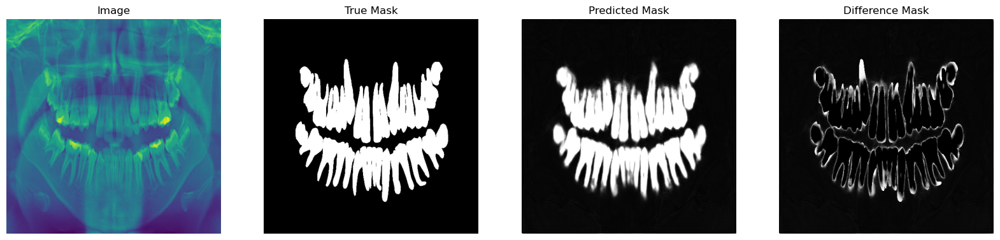

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


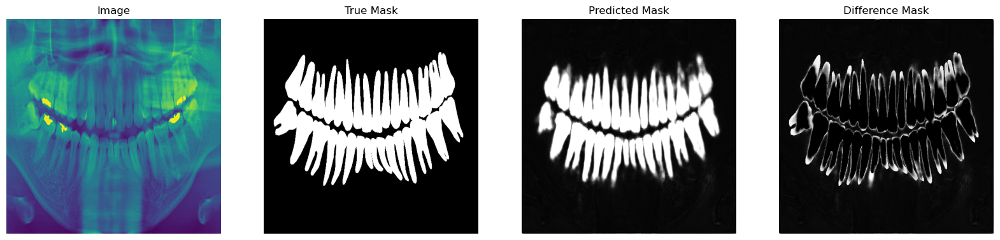

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


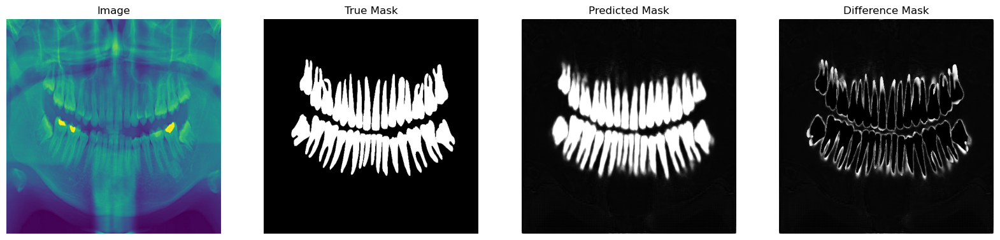

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


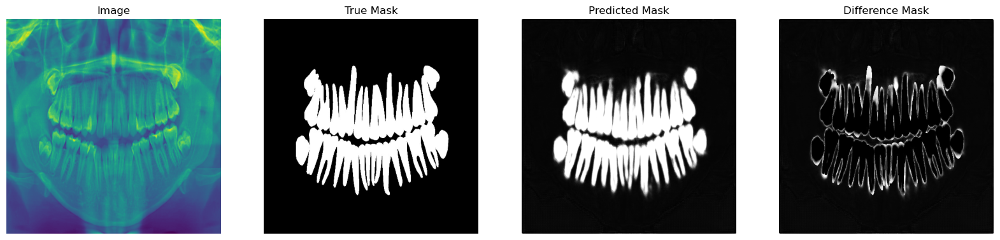

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


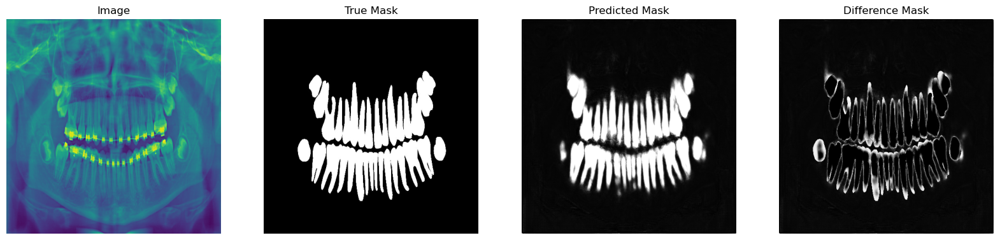

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


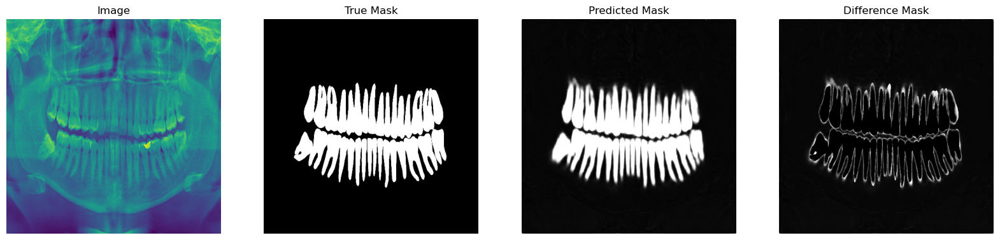

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


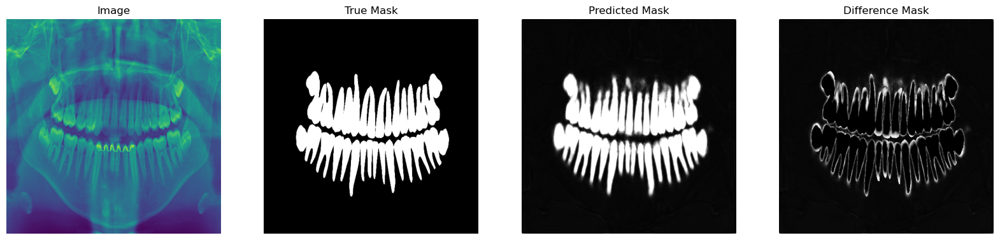

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


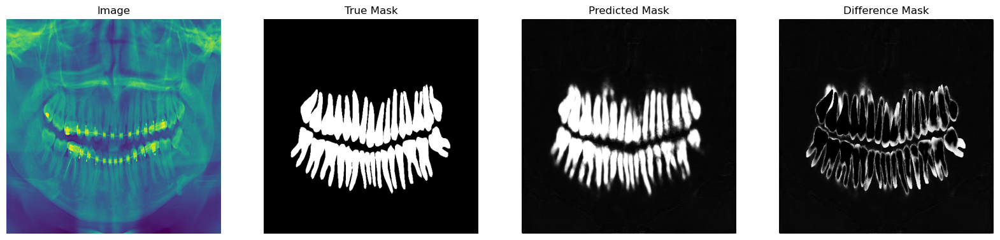

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


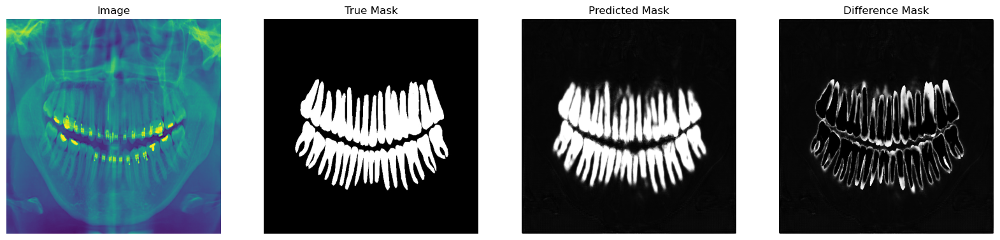

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


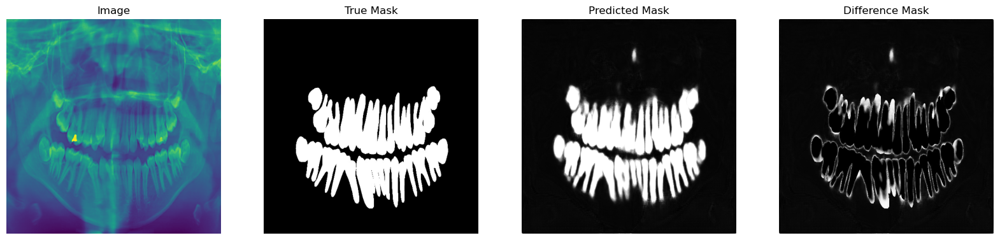

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


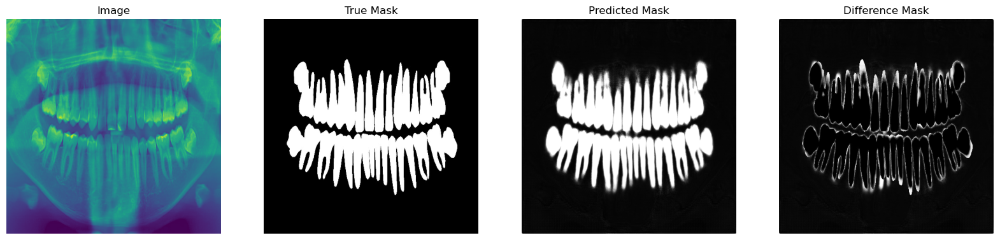

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


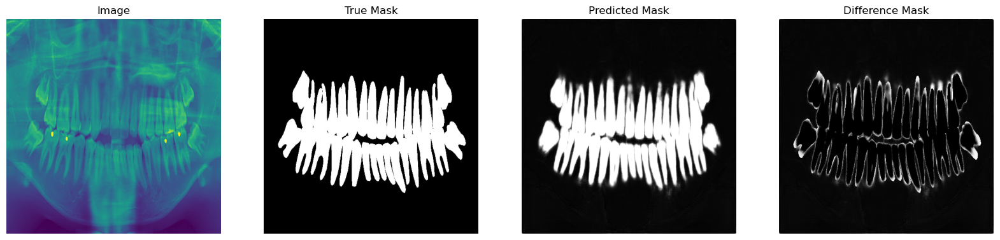

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


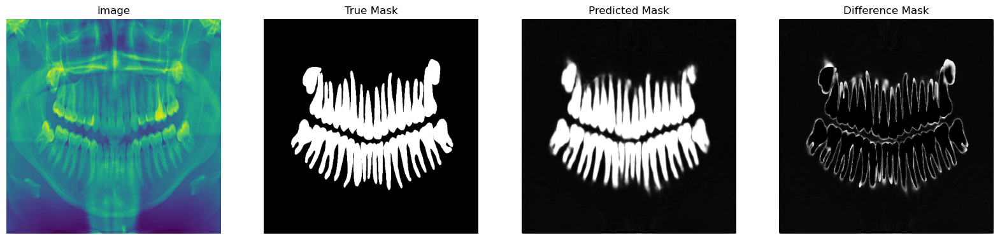

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


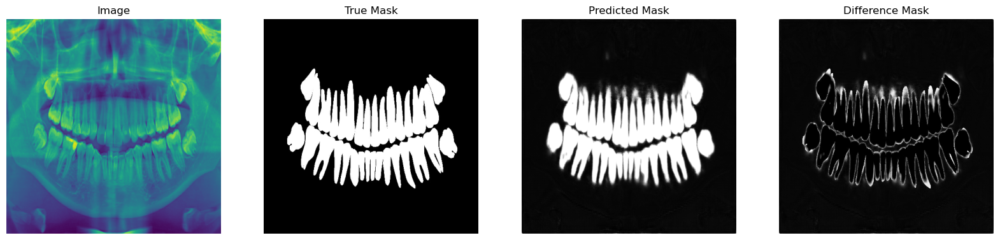

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


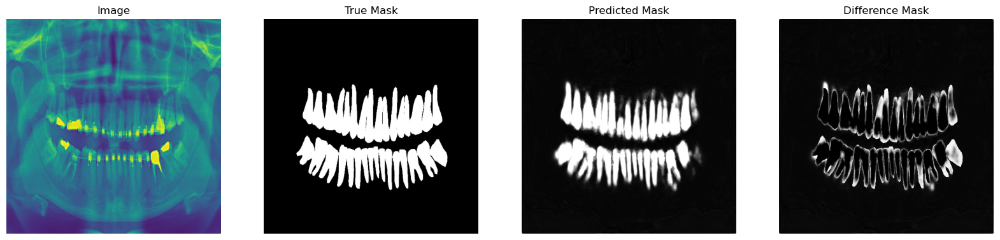

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


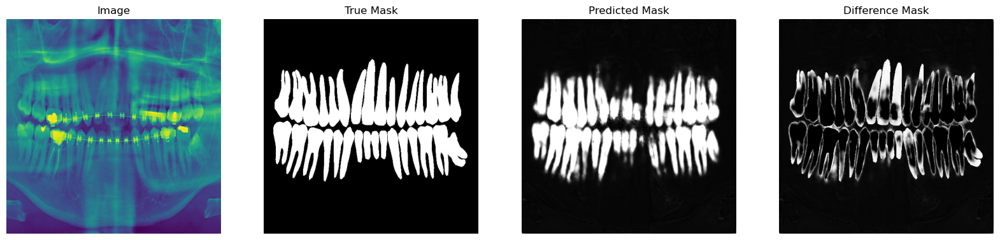

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


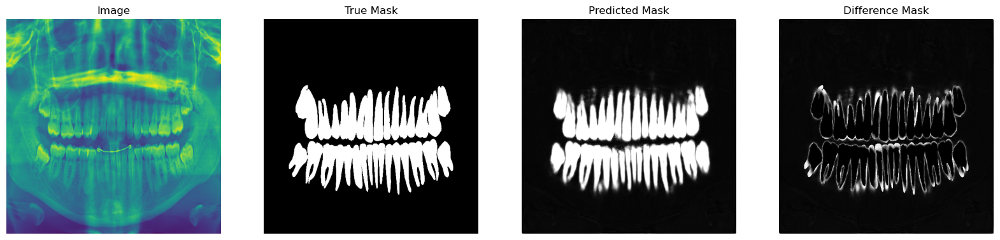

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


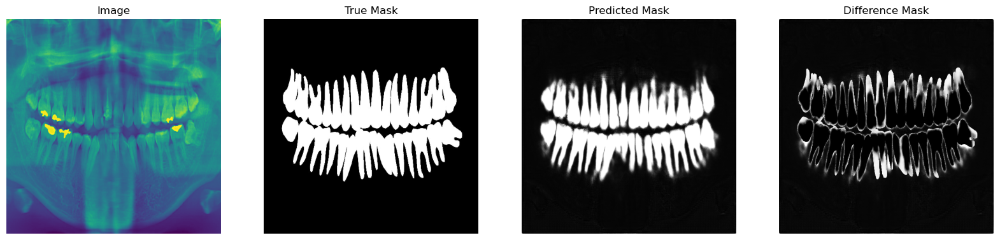

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


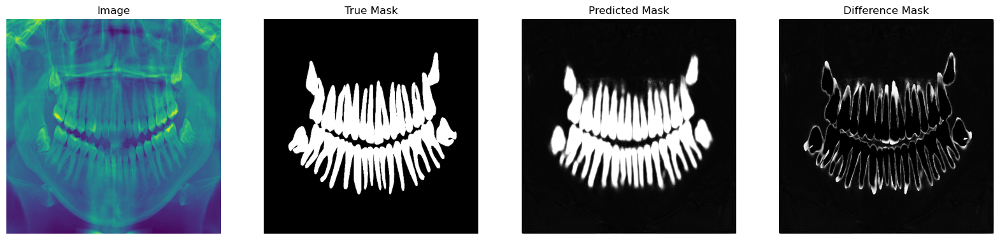

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


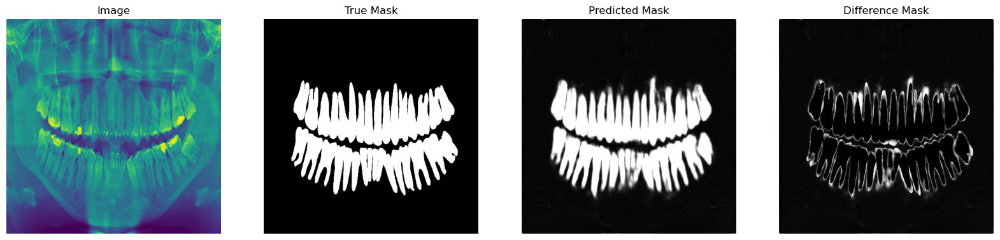

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


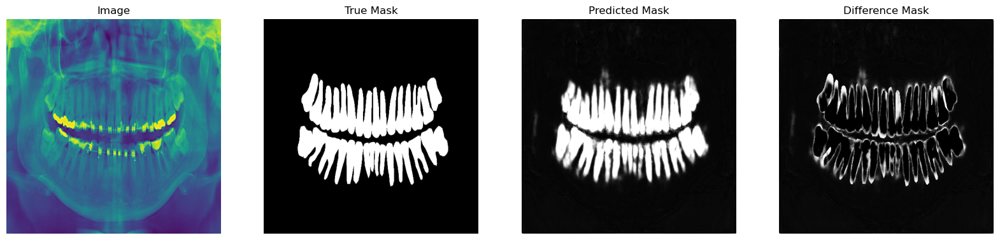

KeyboardInterrupt: 

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import random

def plot_random_images(dataset, model, num_images=5):
    # Rastgele num_images sayısında indeksler seçme
    indices = random.sample(range(len(dataset)), num_images)

    # Seçilen resimler ve maskeleri alma
    for idx in indices:
        for sample in dataset.take(idx):
            image = sample[0][0]
            true_mask = sample[1][0].numpy().squeeze()

            # Tahmin edilen maskeyi alın
            predicted_mask = model.predict(sample[0])[0].squeeze()

            # Fark maskesini hesaplayın
            diff_mask = np.abs(true_mask - predicted_mask)

            # Görselleri çizin
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))

            # Gerçek görüntü
            axes[0].imshow(image)
            axes[0].set_title('Image')
            axes[0].axis('off')

            # Gerçek maske
            axes[1].imshow(true_mask, cmap='gray')
            axes[1].set_title('True Mask')
            axes[1].axis('off')

            # Tahmin edilen maske
            axes[2].imshow(predicted_mask, cmap='gray')
            axes[2].set_title('Predicted Mask')
            axes[2].axis('off')

            # Fark maskesi
            axes[3].imshow(diff_mask, cmap='gray')
            axes[3].set_title('Difference Mask')
            axes[3].axis('off')

            plt.show()

# Rastgele örneklerle görselleri çizin
plot_random_images(test_dataset, model)


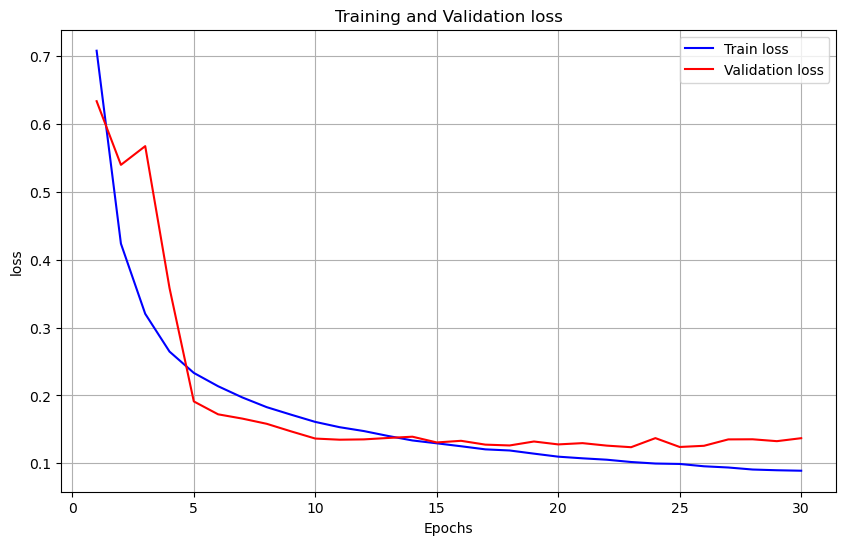

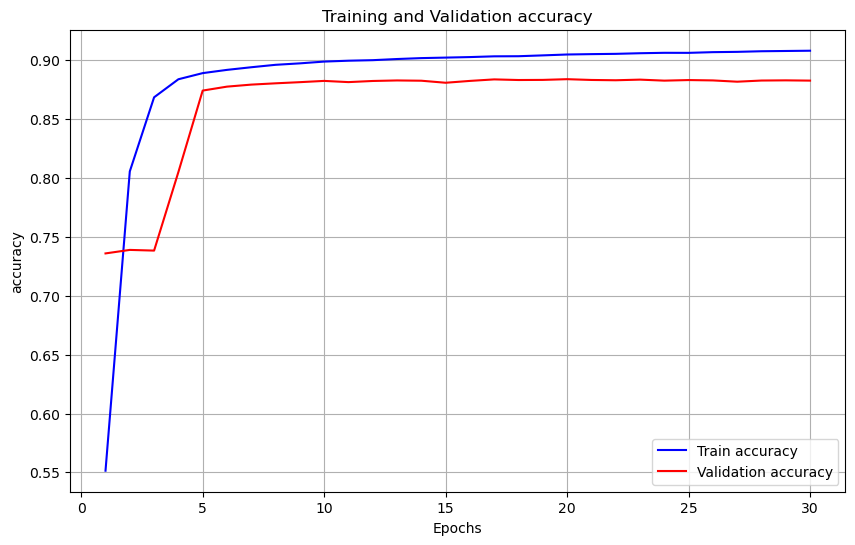

In [35]:
import matplotlib.pyplot as plt

def plot_metrics(history, metric):
    train_metrics = history.history[metric]
    val_metrics = history.history['val_' + metric]

    epochs = range(1, len(train_metrics) + 1)

    plt.figure(figsize=(10, 6))  # Grafik boyutunu ayarla
    plt.plot(epochs, train_metrics, 'b-', label='Train ' + metric)  # Sürekli çizgi stilini kullan
    plt.plot(epochs, val_metrics, 'r-', label='Validation ' + metric)  # Sürekli çizgi stilini kullan
    plt.title('Training and Validation ' + metric)
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)  # Izgara ekle
    plt.show()

# Loss ve accuracy değerlerini aynı grafikte görselleştirme
metrics_to_plot = ['loss', 'accuracy']
for metric in metrics_to_plot:
    plot_metrics(history, metric)


In [36]:
import pandas as pd

def print_metrics(history):
    # Loss ve accuracy değerlerini alın
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Epoch sayısını alın
    epochs = range(1, len(loss) + 1)

    # Verileri DataFrame'e dönüştürün
    metrics_df = pd.DataFrame({
        'Epoch': epochs,
        'Train Loss': loss,
        'Val Loss': val_loss,
        'Train Accuracy': accuracy,
        'Val Accuracy': val_accuracy
    })

    # DataFrame'i tablo olarak yazdırın
    print(metrics_df.to_string(index=False))

# Eğitim geçmişini kullanarak metrikleri yazdırma
print_metrics(history)


 Epoch  Train Loss  Val Loss  Train Accuracy  Val Accuracy
     1    0.708293  0.633877        0.551412      0.735970
     2    0.423816  0.539977        0.805622      0.738950
     3    0.320360  0.567591        0.868563      0.738365
     4    0.264652  0.358374        0.883884      0.805076
     5    0.233220  0.191160        0.889095      0.874270
     6    0.213549  0.172133        0.891850      0.877621
     7    0.196979  0.165805        0.894089      0.879338
     8    0.182707  0.158164        0.896154      0.880437
     9    0.171644  0.147041        0.897387      0.881415
    10    0.160940  0.136397        0.898899      0.882489
    11    0.153156  0.134717        0.899641      0.881456
    12    0.147445  0.135177        0.900095      0.882427
    13    0.140208  0.137272        0.901071      0.882874
    14    0.133588  0.139129        0.901847      0.882641
    15    0.129385  0.130667        0.902279      0.880912
    16    0.125049  0.133079        0.902723      0.8824